### Теория и вопросы

В этом блокноте с помощью аппроксимации экспериментальной кривой коэффициента отражения рассчитывается реальная и мнимая части диэлектрической проницаемости графеновых пленок разной толщины. Суть процедуры аппроксимации: 
1) по МНК или "вручную" найти угол резонанса по InSb, считая диэлектрическую проницаемость известной
2) найти сдвиг между экспериментальным и теоретическим минимумом InSb, сместить начало обеих осей x на это расстояние
3) аппроксимируя кривую графена по известному значению угла и сдвига, найти реальную и мнимую части д.п. графена


Подходит ли pcov из curve_fit для оценки погрешностей
Необходимые условия:
0) нормальный хи-квадрат
1) независимость, нет больших внедиагональных элементов
2) к функции применимо линейное разложение в окрестности оптимальных параметров
3) Якобиан хорошо обусловлен (2 и 3 связаны?)
4) экспериментальная погрешность разумно оценена
5) только случайная погрешность!!!


чувствительность к влажности и к температуре

СИСТЕМАТИЧЕСКАЯ ОШИБКА
- анизотропность
- рассеяние (размеры сравнимы с длиной волны (рассеяние Ми)) 
- скин слой 100 нм в статье IEE (Gerasimov)- плазмоны, он одинаковый для СПР и спектров
- радиационные потери плазмонов
- омические потери учтены
- дифракция

Из документации по scipy.optimize.curve_fit
    pcov : 2-D array
        The estimated approximate covariance of popt. The diagonals provide
        the variance of the parameter estimate. To compute one standard
        deviation errors on the parameters, use
        ``perr = np.sqrt(np.diag(pcov))``. Note that the relationship between
        `cov` and parameter error estimates is derived based on a linear
        approximation to the model function around the optimum [1]_.
        When this approximation becomes inaccurate, `cov` may not provide an
        accurate measure of uncertainty.
    
        How the `sigma` parameter affects the estimated covariance
        depends on `absolute_sigma` argument, as described above.
    
        If the Jacobian matrix at the solution doesn't have a full rank, then
        'lm' method returns a matrix filled with ``np.inf``, on the other hand
        'trf'  and 'dogbox' methods use Moore-Penrose pseudoinverse to compute
        the covariance matrix. 
        
        
        
        
***
Covariance matrices with large condition numbers
(e.g. computed with `numpy.linalg.cond`) may indicate that results are
unreliable.
***

In the Otto geometry the prism–air interface is still a **high-index → low-index step**.  
As soon as you choose an incidence angle θ that satisfies  

$
\theta>\theta_c=\arcsin\!\bigl(n_{\text{air}}/n_{\text{prism}}\bigr),
$

the in-plane component $k_x=n_{\text{prism}}k_0\sin\theta$ is larger than any propagating wave number in air. The field that “leaks” into the gap is therefore **evanescent**:

$
E(z)\;\propto\;e^{-\,\beta z},\qquad
\beta=\sqrt{k_x^{2}-k_0^{2}n_{\text{air}}^{2}}=\frac{1}{L_{\text{ev}}}.
$

### What the metal normally does  
When the air spacer is thin ( $d\lesssim L_{\text{ev}}$ ) the evanescent tail reaches the metal, can drive surface‐plasmon polaritons (SPPs), and energy is dissipated in the metal. In a three-layer Fresnel expression the metal appears through a term  

$
\frac{t_{pa}t_{am}r_{m}e^{-2\beta d}}{1-r_{am}r_{m}e^{-2\beta d}},
$

which subtracts from the bare prism–air reflection coefficient $r_{pa}$ and produces the familiar dip $R<1$.

### Why $R\to1$ when the gap is large  
Let the gap thickness $d$ grow while θ stays super-critical. The factor $e^{-2\beta d}$ then vanishes exponentially, so the metal-dependent term above goes to zero:

$
r_{p}\;\xrightarrow[d\gg L_{\text{ev}}]{}\;r_{pa},\qquad
R=\lvert r_{p}\rvert^{2}\;\xrightarrow[d\gg L_{\text{ev}}]{}\;1.
$

Physically, the evanescent field has already decayed to an amplitude ≪ 1 by the time it could “see” the metal, so **no power is delivered across the gap**. What remains is exactly the situation you would have without any metal at all: a prism–air interface at an angle above θ_c, i.e. **ordinary total internal reflection**. The phase of the reflected wave (Goos–Hänchen and all) is still modified by the evanescent field, but its magnitude is unity.

So “$R=1$ for big gaps” is not a paradox—once the metal is farther away than the evanescent decay length the Otto set-up simply reverts to textbook total internal reflection, and the reflectivity must return to 1.


GPT o3

So switching convention conjugates every material parameter that lives in the phasor — 𝑛, 𝜀, 𝜇. That is all that happens.

One-line takeaway
Changing the global time-harmonic factor is nothing more than complex conjugation of the material responses; do that first, rebuild or conjugate your matrices, and the T-matrix method continues to work without any further sign juggling.

Вопросы:
0) правильность формул для угла: в статье опечатка на графике, но формула вроде правильная. Угол исправить на КОМПЛЕКСНЫЙ
1) Для МНК получается огромная погрешность д.п. Есть ли смысл повторно измерить? 
2) На теорвере матожидание отклонений точек было нулевое? Здесь очевидно, что это не так, можно ли оценивать доверительные интервалы по Фишеру? Независимы ли отклонения разных точек? Матрица ковариации - это и есть "доверительный" эллипсоид? 
3) учесть погрешность измерения в optimize curve ($\sigma$).
4) как вычисляется ковариация eps
5) некорректные обратные задачи?
6) Если увеличить погрешность измерение, хи-квадрат уменьшится, но доверительный интервал увеличится. Как определяется этот интервал?
7) a) Re1Re2<>0 , Im1re2!=/=Im2Re1
   b) есть ли вообще плазмоны в графене (из независимых экспериментов (1-2 слоя) графен+ZnS плазмоны были на 197 мкм). - В графене может и не быть.

Вопросы:
0) работают ли уравнения Максвелла для настолько тонких пленок
1) обоснование выбора участка суммирования: оценить влияние дифракции (систематическую погрешность), оптимальный отступ от границы; попробовать разные участки, мб. обратную задачу с квадр.аппроксимированием разброса угла или фурье-фильтр

диффракция: 

2) учёт тензорного характера д.п. графена: а) продольная и поперечная, б) вдоль толщины. Почему анизотропия только для плазмонов?
3) корректна ли аппроксимация, если резонанс сильно зависит от угла, который из-за дифракции определяется с точностью до десятых градуса; построить график ковариации от д.п., возможно есть смысл разобраться в алгоритмах optimize.curve()
4) по какому участку графика фитировать
5) почему ширина графиков InSb (и угол резонанса?) зависит от толщины графена (сдвиг может зависеть)
6) протестировать метод на InSb, одновременно фитировать его д.п., угол и сдвиг, сравнить д.п. с табличной;
7) протестировать 1 образец дважды, чтобы исключить случайную погрешность (помимо колебаний IMO, которые учтены нормировкой R)
8) какая ошибка в определении нуля гониометра и линейки?

Вопросы после доклада 17.11:
1) свойства образца: размер частиц, есть ли образец с другим размером
2) экспериментальная погрешность в статье photonics (5%??)
3) почему в photonics меньше дифракция?
4) можно расчитать угловое распределение и сделать поправку?
5) как устроен отсчёт нуля
6) почему диэлектрик при малом числе слоев; почему если Re>0, видим плазмоны 
7) роль InSb в распространении плазмона по графену; может ли идти плазмон в InSb если в графене Re>0 (работает ли условие разных знаков Re для трех слоев) и он тонкий (17 нм)
8) чистый PEDOT:PSS - будет ли ППР?
9) модель потери энергии (уширения), все ли входит в матрицы Френеля

Конспект по методам определения неопределенности (Вугрин)

1) Интервалы - общие (joint) или по одному параметру (предполагают независимость параметров)
2) The data itself may havesignificant uncertainties: there may be missing values,measurement error, systematic biases, etc. Nonlinear inverseproblems may involve discontinuities which result in mul-tiple values for the optimal parameters, due to complexitiesin the underlying physics (e.g., significant heterogeneities in material models). The parameters themselves may havesignificant variability as part of their inherent randomness.Finally, model form can also influence the parameter set-tings [Sun, 1999].
 
1. По линеаризации 

1) In linear models, the sum of
squares function is quadratic, and contours of constant sums
of squares are ellipses or ellipsoid surfaces. In nonlinear
models, if one approximates the nonlinear function with a
linear Taylor series expansion about the parameter estimate
^q, the sum of squares approximation is then quadratic.
2) Thus the confidence regions
computed with the linear approximation method may be
compromised by highly nonlinear models, small data sets,
or poor Hessian approximations.

NB У меня $R(\epsilon)$ = min в районе резонанса, а значит расчёт доверительного интервала по линейной модели может не работать? Посчитать гессиан символьно? 

2. По Фишеру:

1) Невязка $\leq$ const,  которая определяется по распределению Фишера
2) Гессиан не вычисляется

3. Логарифм.-макс.-правдоподобия тест

1) если ошибки нормально распределены, то сводится к МНК

зачем лазер: нужна высокая мощность (для области резонанса?) и пространственная когерентность

лсэ: испульсная генерация, но это не влияет

Плазмоны в металле тгц - нелокализованная волна - нельзя в сенсорах

с какой точностью определена толщина
механизмы дифракции плазмонов

надо ли учитывать толщину призмы для потерь?
!!!!! нормировка на поглощение

"found from the reflection spectrum of the InSb
plate, measured with a Bruker IFS 66v/s THz Fourier spectrometer.



Проблема в том, что это объёмное значение, которое может не совпадать с поверхностным

### Импорт

In [1]:
# 1. Standard library imports
import sys, os
import glob
import re
import logging
from collections import namedtuple

# 2. Third-party library import
%matplotlib inline
plt.style.use('default')
from cmath import sqrt
from numpy import pi, exp, sin, cos
import sympy as sy
import ipywidgets as widgets
from ipywidgets import interact, FloatSlider, IntSlider, Dropdown, FloatText
import pandas as pd
from numpy.lib.scimath import arccos # This arccos deals with x>1 for total internal reflection 
from scipy.optimize import curve_fit
from scipy.signal import argrelextrema
import tmm
from tmm import *


# 3. Local application/library specific imports
sys.path.append(r'C:\Users\belco\Documents\Graphene\Graphene-films-plasmon-refractometry\lib')
from coh_tmm_rev_exp import *

In [2]:
%reload_ext autoreload
%autoreload 2

### Константы и данные

In [3]:
# Define some constansts

"""
We neglect the imaginary part of N_PRISM = 1.531 + 1j * 0.002, because we don't know how to midify the formula
"""

N_PRISM = 1.531
EPS_PRISM = N_PRISM**2
N_AIR = 1
EPS_AIR = N_AIR**2
# experimental value for InSb
EPS_INSb = -17 + 7j


In [4]:
# Load data using configurable paths
# Output files are created in file aperture.ipynb

# Function to load data from file
def load_data(file_path):
    return pd.read_csv(file_path, sep='\t', decimal=',')

base_path = r'C:\Users\belco\Documents\Graphene\Data\Data_many_layers'

file_paths = {
    'data_3_5_along': os.path.join(base_path, r'2024.05.17_SPR+microscopy on InSb+Gr-3.5 layaer_197 um_New', r'output_along_3_5_full.ascii'),
    'data_3_5_trans': os.path.join(base_path, r'2024.05.17_SPR+microscopy on InSb+Gr-3.5 layaer_197 um_New', r'output_trans_3_5_full.ascii'),
    'data_6_along': os.path.join(base_path, r'2024.06.04_SPR+microscopy on InSb+Gr-6 layaer_197 um', r'output_along_6_full.ascii'),
    'data_6_trans': os.path.join(base_path, r'2024.06.04_SPR+microscopy on InSb+Gr-6 layaer_197 um', r'output_trans_6_full.ascii'),
    'data_12_along': os.path.join(base_path, r'2024.06.11_SPR+microscopy on InSb+Gr-12 layaer_197&150 um\197 um', r'output_along_12_full.ascii'),
    'data_12_trans': os.path.join(base_path, r'2024.06.11_SPR+microscopy on InSb+Gr-12 layaer_197&150 um\197 um', r'output_trans_12_full.ascii')
}

data_3_5_along = load_data(file_paths['data_3_5_along'])
data_3_5_trans = load_data(file_paths['data_3_5_trans'])
data_6_along = load_data(file_paths['data_6_along'])
data_6_trans = load_data(file_paths['data_6_trans'])
data_12_along = load_data(file_paths['data_12_along'])
data_12_trans = load_data(file_paths['data_12_trans'])

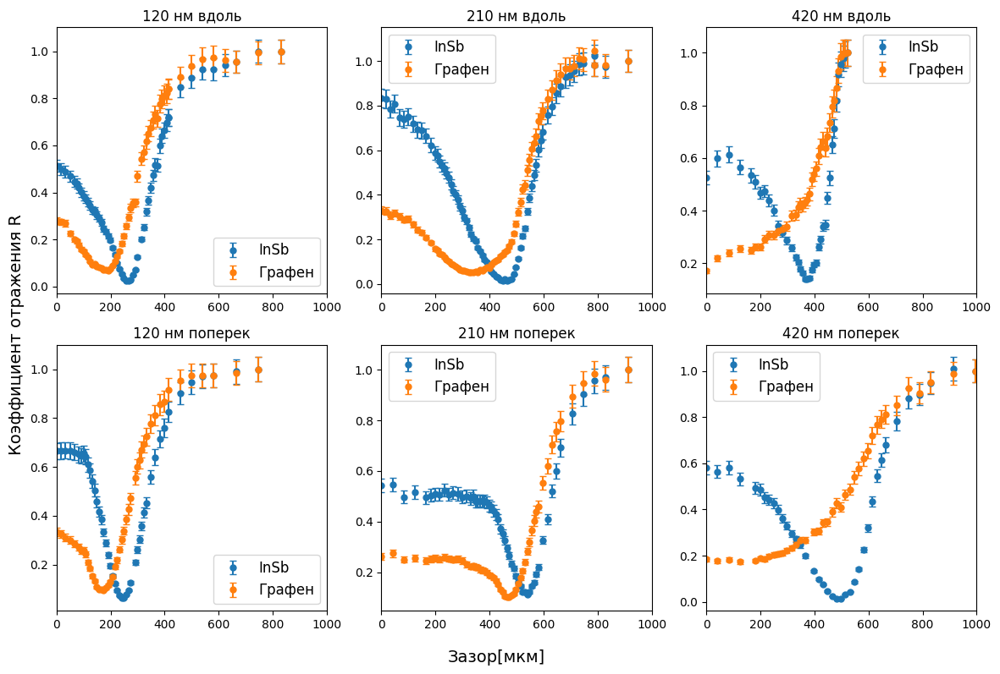

In [5]:
# Эксперимент: графики
fig, axs = plt.subplots(2, 3, figsize=(12, 8))

datasets = [
    (data_3_5_along, '120 нм вдоль',   axs[0, 0]),
    (data_3_5_trans, '120 нм поперек', axs[1, 0]),
    (data_6_along,   '210 нм вдоль',   axs[0, 1]),
    (data_6_trans,   '210 нм поперек', axs[1, 1]),
    (data_12_along,  '420 нм вдоль',   axs[0, 2]),
    (data_12_trans,  '420 нм поперек', axs[1, 2]),
]

sigma = 0.05  # 5% относительная погрешность

# Словарь для переименования поля "материал" в melted
label_map = {'Norm_In': 'InSb', 'Norm_gr': 'Графен'}

for df, title, ax in datasets:
    # melt + замена названий: теперь данные делятся на 2 части: графен и InSb 
    # (это указано в столбце "материал")
    melted = df.melt(
        id_vars='Gap',
        value_vars=['Norm_In', 'Norm_gr'],
        var_name='Материал',
        value_name='Transmittance'
    )
    # сразу меняем метки
    melted['Материал'] = melted['Материал'].map(label_map)
    
    # рисуем errorbar для каждого материала
    for material, grp in melted.groupby('Материал'):
        x = grp['Gap']
        y = grp['Transmittance']
        yerr = sigma * y
        ax.errorbar(
            x, y, yerr=yerr,
            fmt='.', capsize=3, markersize=10,
            label=material
        )
    
    ax.set_xlim(0, 1000)
    ax.set_title(title)
    ax.legend(fontsize=12, loc='best')
    fig.supxlabel('Зазор[мкм]', fontsize=14)
    fig.supylabel('Коэффициент отражения R', fontsize=14)

plt.tight_layout()
plt.show()


### Пример дизайна

### Определение функций

In [6]:
def angle_int(angle_ext, n_1):
    argum = np.sin(pi/4 - angle_ext) / n_1
    teta = arcsin(argum)
    angle_int = pi/4 - teta # angle is complex
    return angle_int

print(angle_int(pi/4-0.1, N_PRISM))

0.7201438836315639


In [7]:
def kz_forward(eps_j, kx, k0=1, tol=1e-12):
    import cmath
    kz = cmath.sqrt(eps_j*k0**2 - kx*kx)   # principal root
    if kz.imag < -tol or (abs(kz.imag) <= tol and kz.real < 0):
        kz = -kz                            # flip to upper half-plane
    return kz


def reflect3(d_2: np.ndarray, teta_int:float, eps3_re, eps3_im,  wavelength = 197 * 10**(-6)):
  

    eps_1 = EPS_PRISM  # Dielectric permittivity of the prism (Zeonex)       
    eps_2 = N_AIR**2  # Dielectric permittivity of air
    eps_3 = eps3_re + eps3_im*1j
    
    # Normal components of wave vectors (normalized by k0)
    kx   = sqrt(eps_1) * np.sin(teta_int) 
    kz_1 = sqrt(eps_1) * np.cos(teta_int)
    kz_2 = kz_forward(eps_2, kx) 
    kz_3 = kz_forward(eps_3, kx)

    # Reflection coefficients
    r_12 = (eps_2 * kz_1 - eps_1 * kz_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    r_23 = (eps_3 * kz_2 - eps_2 * kz_3) / (eps_3 * kz_2 + eps_2 * kz_3)

    # Transmission coefficients
    t_12 = 2 * kz_1 * sqrt(eps_1 * eps_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    t_23 = 2 * kz_2 * sqrt(eps_2 * eps_3) / (eps_3 * kz_2 + eps_2 * kz_3)
    

    # Transformation matrix
    S1 = np.array([[1 / t_12, r_12 / t_12], [r_12 / t_12, 1 / t_12]])

    R = np.zeros(len(d_2))  # Initialize reflection coefficient array

    for j in range(len(d_2)):
        S2 = np.array([[np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        r_23 * np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23],
                    [r_23 * np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23]], dtype=np.complex128)
        
        S = np.dot(S1, S2)
        R[j] = (np.abs(S[1, 0] / S[0, 0]))**2

    return R


reflect3(np.linspace(1e-6, 100e-6, 101), angle_int(pi/4, 1.531 - 1j * 0.002), -7, 17)

array([0.35262286, 0.34521978, 0.3379378 , 0.3307856 , 0.32377188,
       0.31690534, 0.31019464, 0.30364843, 0.29727529, 0.29108371,
       0.28508208, 0.27927865, 0.27368154, 0.26829867, 0.26313777,
       0.25820636, 0.25351168, 0.24906075, 0.24486027, 0.24091661,
       0.23723586, 0.2338237 , 0.23068547, 0.22782611, 0.22525016,
       0.22296172, 0.22096447, 0.21926162, 0.21785593, 0.21674968,
       0.21594467, 0.21544223, 0.21524315, 0.21534779, 0.21575595,
       0.21646698, 0.21747972, 0.21879251, 0.22040322, 0.22230923,
       0.22450749, 0.22699444, 0.22976613, 0.23281814, 0.23614566,
       0.23974348, 0.24360601, 0.24772729, 0.25210104, 0.25672065,
       0.2615792 , 0.26666952, 0.27198418, 0.27751551, 0.28325563,
       0.2891965 , 0.2953299 , 0.30164749, 0.30814079, 0.31480125,
       0.32162026, 0.32858914, 0.3356992 , 0.34294175, 0.3503081 ,
       0.35778961, 0.36537768, 0.3730638 , 0.38083953, 0.38869655,
       0.39662664, 0.40462172, 0.41267387, 0.4207753 , 0.42891

0.9999999999203848


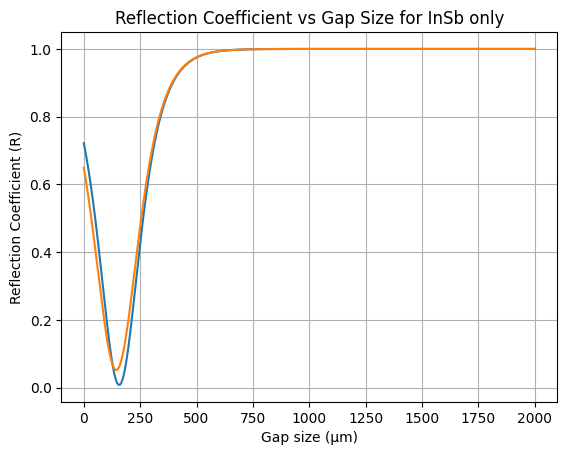

In [8]:
# Vizualize reflect3

d_2 = np.arange(0, 2000 * 10**(-6), 1 * 10**(-6))  # Gap size between the prism and InSb
eps3_re, eps3_im = (-17, 7)
a, b = (-17, 10)
teta_ext = 0.71
teta_int = (0.73)
params = [d_2, teta_int, eps3_re, eps3_im]
params1 = [d_2, teta_int, a, b]
R = reflect3(*params)
R1 = reflect3(*params1)
print(R[-10])

# Plot the results
plt.plot(d_2 * 10**6, R)  # Convert d_2 to micrometers for plotting
plt.plot(d_2 * 10**6, R1)  # Convert d_2 to micrometers for plotting
plt.xlabel('Gap size (µm)')
plt.ylabel('Reflection Coefficient (R)')
plt.title('Reflection Coefficient vs Gap Size for InSb only')
plt.grid()

plt.show()

In [9]:
# define reflect4 by V.V.'s code
# teta_ext - external incidence angle,  d_2 - gap, d_3 - Gr, eps_re/im - gr

def reflect4(d_2, d_3, teta_int, eps3_re, eps3_im, eps4_re, eps4_im, wavelength = 197 * 10**(-6)): 
    
    n_1 = N_PRISM  # Complex refractive index of the prism (Zeonex)
    eps_1 = EPS_PRISM # Dielectric permittivity of the prism (Zeonex)
    eps_2 = EPS_AIR  #Dielectric permittivity of air"
    eps_3 = eps3_re+eps3_im*1j
    eps_4 = eps4_re+eps4_im*1j

    # Normal components of wave vectors (normalized by k0)
    kz_1 = sqrt(eps_1) * np.cos(teta_int)
    kz_2 = sqrt(eps_2 - eps_1 * np.sin(teta_int)**2)
    kz_3 = sqrt(eps_3 - eps_1 * np.sin(teta_int)**2)
    kz_4 = sqrt(eps_4 - eps_1 * np.sin(teta_int)**2)

    # Reflection coefficients
    r_12 = (eps_2 * kz_1 - eps_1 * kz_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    r_23 = (eps_3 * kz_2 - eps_2 * kz_3) / (eps_3 * kz_2 + eps_2 * kz_3)
    r_34 = (eps_4 * kz_3 - eps_3 * kz_4) / (eps_4 * kz_3 + eps_3 * kz_4)

    # Transmission coefficients
    t_12 = 2 * kz_1 * sqrt(eps_1 * eps_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    t_23 = 2 * kz_2 * sqrt(eps_2 * eps_3) / (eps_3 * kz_2 + eps_2 * kz_3)
    t_34 = 2 * kz_3 * sqrt(eps_3 * eps_4) / (eps_4 * kz_3 + eps_3 * kz_4)

    # Transformation matrices
    S1 = np.array([[1 / t_12, r_12 / t_12], [r_12 / t_12, 1 / t_12]])
    S3 = np.array([[np.exp(-1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34,
                    r_34 * np.exp(-1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34],
                    [r_34 * np.exp(1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34,
                    np.exp(1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34]])

    R = np.zeros(len(d_2))  # Initialize reflection coefficient array

    for j in range(len(d_2)):
        S2 = np.array([[np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        r_23 * np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23],
                        [r_23 * np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23]], dtype=np.complex128)
        
        S = S1 @ S2 @ S3  # Matrix multiplication
        R[j] = (np.abs(S[1, 0] / S[0, 0]))**2

    return R


   

In [10]:
# Visualize reflect4
@widgets.interact(teta = '7.3576e-01', gr_thickness = '35e-6', eps3_re = '-100', eps3_im = '100', eps4_re = '-17', eps4_im = '7')
def visualize_reflect4(teta, gr_thickness, eps3_re, eps3_im, eps4_re, eps4_im):
    teta = float(teta)
    gr_thickness = float(gr_thickness)
    eps3_re, eps3_im = (float(eps3_re), float(eps3_im))
    eps4_re, eps4_im = (float(eps4_re), float(eps4_im))

    d_2 = np.arange(0, 650e-6, 2e-6)  # Gap size between the prism and InSb (microns)
    

    # Dielectric permittivity of the thin dielectric layer on InSb
    
    R3 = reflect3(d_2, teta, eps4_re, eps4_im)
    R4 = reflect4(d_2, gr_thickness, teta, eps3_re, eps3_im, eps4_re, eps4_im)
    print()

    # Plot the results
    plt.plot(d_2 * 1e6, R3, color = 'red', label = 'InSb')
    plt.plot(d_2 * 1e6, R4, color = 'green', label = 'Graphene')  # Convert d_2 to micrometers for plotting
    plt.xlabel('Gap size (µm)')
    plt.ylabel('Reflection Coefficient (R)')
    plt.title('Reflection Coefficient vs Gap Size for InSb+Graphene')
    plt.grid()
    plt.legend()
    plt.show()

interactive(children=(Text(value='7.3576e-01', description='teta'), Text(value='35e-6', description='gr_thickn…

Найдём разброс по углу падения:
1) разброс внешнего угла - из дифракции на щели
2) внутренний угол: аргумент arcsin и arctg мал, 

c:\Users\belco\miniconda3\envs\myenv\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


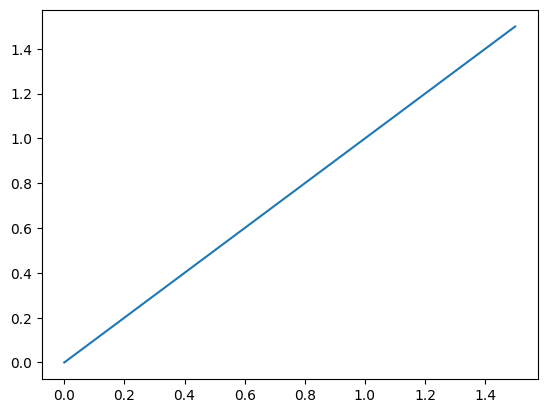

In [11]:
def angle_int(angle_ext, n_1):
    a = pi/4 - angle_ext
    argum = np.sin(pi/4 - angle_ext) / n_1
    teta = arcsin(argum)
    angle_int = pi/4 - teta # angle is complex
    return angle_int

def approx_angle_int(angle_ext, n_1):
    return pi/4-pi/4/n_1.re + angle_ext/n1_re


teta_ext = np.arange(0, 1.57, 0.1)
teta_int = np.vectorize(angle_int)(teta_ext, 1 - 1j * 0.002)
plt.plot(teta_ext, teta_int)




In [12]:
# Найдём тета истинного резонанса (провал до нуля), потом попробуем нарисовать на интерактивном графике
"угол должен быть комплексным! Но мы пренебрегаем поглощением призмы."

def plot_angle():
    def angle_function_In(x, angle):
        return reflect3(x, angle, -17, 7, wavelength=197e-6)

    angle = np.linspace(0.7, 0.8, 10000)
    gap = np.linspace(50*1e-6, 500*1e-6, 100 )
    R_min = np.array([np.min(angle_function_In(gap, angles)) for angles in angle])
    


    plt.plot(angle, R_min)
    print(list(zip(angle, gap)))


plot_angle()



KeyboardInterrupt: 

### How to shift

1. In
Norm_In = Norm_In(Gap)

1) f_func[i](x, shift, angle[i]) = reflect(x - shift[i]), i - dataframe index  -  Shifted theory reflection function
2) fitting:  {Norm_In(Gap)) :    f_func[shift, angle](Gap)
3) plot with erased shift
a) theory: 
plot(gap*1e6, fitting_function_In(gap+fitted_shift, fitted_shift, fitted_angle))
which is equal to: plot(Gap*1e6, reflect(Gap, angle[i])), 
example: 0-> reflect(0)

b) shifted exper: scatterplot((Gap - fitted_shift)*1e6 -> Norm_In(Gap))  ; also remove negative values 

example:  0 -> NormIn(Gap = shift)

2. Gr









In [12]:
# Проверка на аппроксимации eps на чистом InSb




@widgets.interact(left_num_In = 3, right_num_In = 12, rel_sigma = 0.05, 
                  shift_low='1e-04', shift_high = '2e-04', angle_re_low = '7.230e-01', angle_re_high = '7.231e-01', 
                )
def plot_graphs(left_num_In, right_num_In, rel_sigma, shift_low, shift_high, angle_re_low, angle_re_high):
    
    shift_low=float(shift_low)
    shift_high = float(shift_high)
    angle_re_low = float(angle_re_low)
    angle_re_high = float(angle_re_high)


    


    # Dataframes 
    dfs = [data_3_5_along, data_3_5_trans, data_6_along, data_6_trans, data_12_along, data_12_trans]
    titles = ['data_3_5_along', 'data_3_5_trans', 'data_6_along', 'data_6_trans', 'data_12_along', 'data_12_trans']
    # толщина слоёв графена
    thickness = np.array([3.5, 3.5, 6, 6, 12, 12])*35e-9
    
    # Create a figure for subplots
    fig, axes = plt.subplots(3, 2, figsize=(15, 20))
    axes = axes.flatten()
    
    def fitting_function_In(x, fitted_shift, fitted_angle_re, re_InSb, im_InSb):
        fitted_angle = fitted_angle_re
        return reflect3(x - np.ones(x.size, dtype=np.float64) * fitted_shift, fitted_angle, re_InSb, im_InSb, wavelength=197e-6)

    



    
    for i, df in enumerate(dfs):
        gap = df['Gap'].values.astype(np.float64) * 1e-6
        norm_in = df['Norm_In'].values.astype(np.float64)
        
        # Dynamic initial guesses 
        initial_guess = [(shift_low+shift_high)/2, (angle_re_low+angle_re_high)/2, -17, 7]

        
        # Ensure min_index and max_index are within bounds
        min_index = max(norm_in.argmin() - left_num_In, 0)
        max_index = min(norm_in.argmin() + right_num_In, len(gap))

        print(norm_in.argmin(), min_index, max_index, ';')
        
        
        try:
            x_data = gap[min_index:max_index]
            y_data = norm_in[min_index:max_index]
            y_errors = rel_sigma*norm_in[min_index:max_index]
            my_bounds = ([shift_low, angle_re_low, -inf, -inf], [shift_high, angle_re_high, inf, inf])
            params_In, pcov_In, _, mesg_In, ier_In = curve_fit(fitting_function_In, 
                                                            x_data, y_data, p0=initial_guess, bounds=my_bounds, 
                                                            sigma = y_errors, absolute_sigma=True, method='trf', full_output=True)
            
            y_fit = fitting_function_In(x_data, *params_In)
            fitted_shift, fitted_angle_re, fitted_re_InSb, fitted_im_InSb  = params_In
            fitted_angle = fitted_angle_re
            red_chi_square = np.sum(((y_data - y_fit) / y_errors) ** 2)/(right_num_In+left_num_In+1-len(params_In))
            print(f'params_In:{params_In}, sigma: {np.sqrt(np.diag(pcov_In))}, pcov_In:{pcov_In}, mesg_In:{mesg_In} , \n ier_In:{ier_In}, reduced chi square:{red_chi_square}\n')
        

        except RuntimeError as e:
            print(f"Fitting failed for Dataframe {i+1}: {e}")
            params_In = initial_guess
        
        # Validate params_In before using them in the fitting function
        if not np.any(np.isnan(params_In)) and not np.any(np.isinf(params_In)):
            # Plot the original data
            axes[i].scatter((gap - fitted_shift)*1e6, norm_in, color='blue', label='Norm_In', s=5, alpha=0.6)
            
            # Plot the fitted function
            axes[i].plot((gap - fitted_shift)*1e6, fitting_function_In(gap, *params_In), color='red', label=f'Fitted reflect3')
        else:
            print(f"Invalid fitting parameters for Dataframe {i+1}, skipping plot.")

        if i == 1:
            plt.figure()
            gap_linspace = np.linspace(gap[0], gap[-1], 1000)
            plt.scatter(gap*1e6, norm_in)
            plt.plot(gap_linspace*1e6, fitting_function_In(gap_linspace, *params_In))
            plt.plot(gap_linspace*1e6, fitting_function_In(gap_linspace - fitted_shift, *params_In))
            start_of_arrow = (gap[np.argmin(norm_in)-10]*1e6, norm_in[np.argmin(norm_in)-10])
            end_of_arrow = ((gap[np.argmin(norm_in)-10]+fitted_shift)*1e6, norm_in[np.argmin(norm_in)-10])
            plt.annotate('', xy=end_of_arrow, xytext=start_of_arrow, 
                arrowprops=dict(arrowstyle='->', color='blue', lw=2)
            )
            plt.savefig("Shift method")
        
        # Set subplot title and labels
        
        axes[i].set_title(titles[i])
        axes[i].set_xlabel('Gap [mkm]')
        axes[i].set_ylabel('Reflectance')
        axes[i].legend()
    # Adjust layout and show the plot
    plt.tight_layout()





interactive(children=(IntSlider(value=3, description='left_num_In', max=9, min=-3), IntSlider(value=12, descri…

In [27]:
# Считаем известным eps InSb = -17 + 7j




@widgets.interact(left_num_In = 3, right_num_In = 12, rel_sigma = 0.05, 
                  shift_low='0e-04', shift_high = '3e-04') 

def plot_graphs(left_num_In, right_num_In, rel_sigma, shift_low, shift_high):
    
    angles = np.array([0.723 , 0.723 , 0.723 , 0.7231, 0.7231, 0.723 ])

    shift_low, shift_high = float(shift_low), float(shift_high)
    


    # Dataframes 
    dfs = [data_3_5_along, data_3_5_trans, data_6_along, data_6_trans, data_12_along, data_12_trans]
    titles = ['data_3_5_along', 'data_3_5_trans', 'data_6_along', 'data_6_trans', 'data_12_along', 'data_12_trans']
    # Create a figure for subplots
    fig, axes = plt.subplots(3, 2, figsize=(15, 20))
    axes = axes.flatten()
    
    # так мы задаем i угол, который подобрали в ручную
    def create_fitting_function_In(i):
        def fitting_function_In(x, fitted_shift):
            return reflect3(x - np.ones(x.size, dtype=np.float64) * fitted_shift, angles[i], EPS_INSb.real, EPS_INSb.imag, wavelength=197e-6)
        return fitting_function_In
    



    
    for i, df in enumerate(dfs):
        gap = df['Gap'].values.astype(np.float64) * 1e-6
        norm_in = df['Norm_In'].values.astype(np.float64)
        
        # Dynamic initial guesses 
        initial_guess = [(shift_low+shift_high)/2]

        # так мы задаем i угол, который подобрали в ручную
        fitting_function_In = create_fitting_function_In(i)

        # Ensure min_index and max_index are within bounds
        min_index = max(norm_in.argmin() - left_num_In, 0)
        max_index = min(norm_in.argmin() + right_num_In, len(gap))

        print(norm_in.argmin(), min_index, max_index, ';')
        
        
        try:
            x_data = gap[min_index:max_index]
            y_data = norm_in[min_index:max_index]
            y_errors = rel_sigma*norm_in[min_index:max_index]
            my_bounds = ([shift_low], [shift_high])
            params_In, pcov_In, _, mesg_In, ier_In = curve_fit(fitting_function_In, 
                                                            x_data, y_data, p0=initial_guess, bounds=my_bounds, 
                                                            sigma = y_errors, absolute_sigma=True, method='trf', full_output=True)
            
            y_fit = fitting_function_In(x_data, *params_In)
            fitted_shift = params_In[0]
            red_chi_square = np.sum(((y_data - y_fit) / y_errors) ** 2)/(right_num_In+left_num_In+1-len(params_In))
            print(f'params_In:{params_In}, sigma: {np.sqrt(np.diag(pcov_In))}, pcov_In:{pcov_In}, mesg_In:{mesg_In} , \n ier_In:{ier_In}, reduced chi square:{red_chi_square}\n')
        

        except RuntimeError as e:
            print(f"Fitting failed for Dataframe {i+1}: {e}")
            params_In = initial_guess
        
        # Validate params_In before using them in the fitting function
        if not np.any(np.isnan(params_In)) and not np.any(np.isinf(params_In)):
            # Plot the original data
            axes[i].scatter((gap - fitted_shift)*1e6, norm_in, color='blue', label='Norm_In', s=5, alpha=0.6)
            
            # Plot the fitted function
            axes[i].plot((gap - fitted_shift)*1e6, fitting_function_In(gap, *params_In), color='red', label=f'Fitted reflect3')
        else:
            print(f"Invalid fitting parameters for Dataframe {i+1}, skipping plot.")
        
        # Set subplot title and labels
        
        axes[i].set_title(titles[i])
        axes[i].set_xlabel('Gap [mkm]')
        axes[i].set_ylabel('Reflectance')
        axes[i].legend()
    # Adjust layout and show the plot
    plt.tight_layout()

interactive(children=(IntSlider(value=3, description='left_num_In', max=9, min=-3), IntSlider(value=12, descri…

исправил, сделал мнимую часть угла, норм хи квадрат фитинг чистый индий transverse 1 layer образец 

24 16 31 ;
[fitted_shift, fitted_angle]: 0.0001203165316733229 (0.7377302350629975-0.006154604313067609j), pcov_In:[[ 2.39767591e-11  4.56150767e-09 -7.90078736e-09]
 [ 4.56150767e-09  8.89447731e-07 -1.51661026e-06]
 [-7.90078736e-09 -1.51661026e-06  2.63926875e-06]], sigma: [4.89660690e-06 9.43105366e-04 1.62458264e-03], mesg_In:`xtol` termination condition is satisfied. , 
ier_In:3, reduced chi square:1.1699447110422736


### Угол и сдвиг находится вручную по минимуму и близким точкам, считаем хи-квадрат (погрешность - 0.05)
### Неплохо бы обосновать процедуру выбора точек
GPT:  


Degrees of Freedom: This is calculated as the number of data points minus the number of parameters estimated in the model.

A value of χ²_(red) ≈ 1 suggests a good fit, while values significantly greater than 1 may indicate that the model does not fit the data well.

In general, a lower chi-square value indicates a better fit of the model to the data. However, to evaluate whether a chi-square value is acceptable or optimal, you typically compare it to the degrees of freedom (df) of your model:

Goodness-of-Fit Tests: Additionally, you can use statistical tests (like the chi-square goodness-of-fit test) to determine if your chi-square value is statistically significant compared to a critical value from the chi-square distribution for your degrees of freedom.

In summary, there is no single "optimal" chi-square value; instead, you should aim for a reduced chi-square close to 1 and consider other diagnostic measures (like residuals and visualizations) to assess model fit.






3.5 along
28 25 40 ;
[shift, angle]: 0.00011896489348631966 0.7230737459726524, pcov_In:[[ 1.01304055e-13 -1.03822582e-11]
 [-1.03822582e-11  5.75908992e-09]], sigma: [3.18282980e-07 7.58886679e-05], mesg_In:`xtol` termination condition is satisfied. , 
 ier_In:3, reduced chi square:4.299263501246354

3.5 trans:

24 21 36 ;
[shift, angle]: 9.700000000000001e-05 0.7342699249999999, pcov_In:[[4.75914050e-13 1.51478850e-11]
 [1.51478850e-11 7.47523558e-09]], sigma: [6.89865240e-07 8.64594447e-05], mesg_In:`gtol` termination condition is satisfied. , 
 ier_In:1, reduced chi square:6.653993376630582


6 along:
42 39 54 ;
[shift, angle]: 0.00031200000000000005 0.7264626647693478, pcov_In:[[ 2.58033707e-14 -1.12019925e-11]
 [-1.12019925e-11  1.30003392e-08]], sigma: [1.60634276e-07 1.14019030e-04], mesg_In:`ftol` termination condition is satisfied. , 
 ier_In:2, reduced chi square:282.4850790128894


shifts = np.array([0.000118964, 9.70000e-5, 0.000312, 0.0004080, 0.00023420, 0.00034412])
angles = np.array([0.723073, 0.734269, 0.7264626, 0.715108, 0.738664470, 0.7280000])


6 trans:
39 36 51 ;
[shift, angle]: 0.00040800000006976044 0.715108447896622, pcov_In:[[ 6.06162301e-13 -6.92594494e-11]
 [-6.92594494e-11  3.48587462e-08]], sigma: [7.78564256e-07 1.86704971e-04], mesg_In:`xtol` termination condition is satisfied. , 
 ier_In:3, reduced chi square:2.737866706759637

12 along:

19 16 23 ;
[shift, angle]: 0.00023420000000467993 0.738664470742743, pcov_In:[[3.71728912e-12 8.85575337e-11]
 [8.85575337e-11 2.17865194e-08]], sigma: [1.92802726e-06 1.47602572e-04], mesg_In:`xtol` termination condition is satisfied. , 
 ier_In:3, reduced chi square:1.0975064627008828

12 trans:

21 18 24 ;
[shift, angle]: 0.00034412810000000006 0.7280000000000001, pcov_In:[[ 8.50975684e-14 -8.24917888e-11]
 [-8.24917888e-11  1.24385293e-07]], sigma: [2.91714875e-07 3.52682993e-04], mesg_In:`gtol` termination condition is satisfied. , 
 ier_In:1, reduced chi square:1128.7845094026875





In [28]:
# Fitting permittivity of graphene

FITTED_EPS_GR = np.zeros((6, 2))
FITTED_EPS_ERR = np.zeros((6, 2))

# угол и сдвиг из предыдущей подгонки по кривой InSb

columns = ['толщина[нм]', 'ориентация', 'Re', '$\chi^2$ Re', 'Im', '$\chi^2$ Im']
re_im_eps_result = pd.DataFrame()

@widgets.interact(left_num_gr = 3, right_num_gr = 30, rel_sigma = 0.05, re_InSb_tab = -17, im_InSb_tab = 7, 
                  re_Gr_low ='-1000', re_Gr_high = '900', im_Gr_low = '-1000',  im_Gr_high = '900', angle_re = '0.73773') 
def plot_graphs_in(left_num_gr, right_num_gr, rel_sigma, re_InSb_tab, im_InSb_tab, re_Gr_low, re_Gr_high, im_Gr_low,  im_Gr_high, angle_re):    

    #angles = np.ones(6)*float(angle)

    

    re_Gr_low, re_Gr_high, im_Gr_low, im_Gr_high, angle_re  =  (float(re_Gr_low), float(re_Gr_high), float(im_Gr_low), float(im_Gr_high), float(angle_re))
    angle = angle_re

    # Dataframes 
    dfs = [data_3_5_along, data_6_along, data_12_along, data_3_5_trans, data_6_trans, data_12_trans]

    


    # толщина слоёв
    thickness = np.array([3.5, 6, 12, 3.5, 6, 12])*35e-9
    shifts = np.array([0.00011627,  0.000312,  0.00023420, 9.70000e-5,   0.0004080,  0.00034412])   
    #angles = np.array([0.723073, 0.73773-0.0061546j, 0.7264626, 0.715108, 0.738664470, 0.7280000])
    angles = np.ones(6)*angle

    

    # Create a figure for subplots
    fig, axes = plt.subplots(2, 3, figsize=(15, 9))
    axes = axes.flatten()



    for i, df in enumerate(dfs):

        gap = df['Gap'].values.astype(np.float64) * 1e-6
        norm_gr = df['Norm_gr'].values.astype(np.float64)
    

        def fitting_function_gr(x, eps3_re, eps3_im):
            return reflect4(x - shifts[i], d_3 = thickness[i], 
                            teta_int = angles[i], eps3_re=eps3_re, eps3_im=eps3_im, eps4_re=re_InSb_tab, eps4_im=im_InSb_tab)
        



        # Dynamic initial guesses based on data statistics
        initial_guess = [(re_Gr_low+re_Gr_high)/2, (im_Gr_low+im_Gr_high)/2]
        my_bounds = ([re_Gr_low, im_Gr_low], [re_Gr_high, im_Gr_high])



        # Ensure min_index and max_index are within bounds
        min_index = max(norm_gr.argmin() - left_num_gr, 0)
        max_index = min(norm_gr.argmin() + right_num_gr, len(gap))
    
        x_data = gap[min_index:max_index]
        y_data = norm_gr[min_index:max_index]
        y_errors = rel_sigma*norm_gr[min_index:max_index]

        try:
            params, pcov , infodict , mesg , ier = curve_fit(fitting_function_gr, 
                                                             x_data, y_data, 
                                                             p0=initial_guess, bounds=my_bounds, method='trf', full_output=True, 
                                                             sigma = y_errors, absolute_sigma=True)  
            
            fitted_values = fitting_function_gr(x_data, *params)
            red_chi_square = np.sum(((y_data - fitted_values) / y_errors) ** 2)/(right_num_gr+left_num_gr+1-len(params))


            print(f'[Re Gr, Im Gr]: {params} , pcov_gr:{pcov}, sigma: {np.sqrt(np.diag(pcov))}, mesg_In:{mesg} , \n ier_In:{ier}, reduced chi square:{red_chi_square}\n') 
        except RuntimeError as e:
            print(f"Fitting failed for Dataframe {i+1}: {e}")
            params = initial_guess

        # Validate params before using them in the fitting function
        if not np.any(np.isnan(params)) and not np.any(np.isinf(params)):
            # Plot the original data

            #Учёт сдвига

            FITTED_EPS_GR[i] = params
            FITTED_EPS_ERR[i] = np.sqrt(np.diag(pcov))
            axes[i].errorbar((gap -shifts[i])*1e6, norm_gr, color='green', yerr=rel_sigma*norm_gr,
            fmt='.', capsize=2, markersize=5, elinewidth=2, label='Эксперимент')

            # Plot the fitted function

            #Функция учитывает сдвиг
            fitted_values = fitting_function_gr(gap, *params)
            if not np.any(np.isnan(fitted_values)) and not np.any(np.isinf(fitted_values)):
                #axes[i].plot(gap*1e6, fitting_function_gr(gap+shifts[i], *params), color='red')
            #                label = 'fitting' 
                theory_x_axis = (np.linspace(min(gap), max(gap), 1000)-shifts[i])*1e6
                axes[i].plot(theory_x_axis, fitting_function_gr(np.linspace(min(gap), max(gap), 1000), *params), label = 'Аппроксимация',
                             linewidth=3)
                axes[i].axvline(x=0, color='red', linestyle='--', label='Нулевой зазор', linewidth=0.5)

            #    if red_chi_square < 2:
            #    global re_im_eps_result.loc[i] = [thickness[i], orientation[i], red_chi_square, *params, *perr]    
                          
            else:
                print(f"Invalid fitted values for Dataframe {i+1}, skipping plot.")
        else:
            print(f"Invalid fitting parameters for Dataframe {i+1}, skipping plot.")
        

        # Set subplot title and labels
        titles = ["120 нм вдоль", "210 нм вдоль", "420 нм вдоль", "120 нм поперек", "210 нм поперек", "420 нм поперек"]
        axes[i].set_title(titles[i], fontsize=18)
        axes[i].legend(loc='lower right', fontsize='x-small')
        #axes[i].set_xlim(0, 600)
    fig.supxlabel('Зазор[мкм]', fontsize=18)
    fig.supylabel('Коэффициент отражения R', fontsize=18)




    # Adjust layout and show the plot
    


    plt.show()  




interactive(children=(IntSlider(value=3, description='left_num_gr', max=9, min=-3), IntSlider(value=30, descri…

[3.57675992 1.36184354 2.85310786] [5.09338634 3.18243826 1.05542706] [3.78882675 2.39761821 2.22323506] [4.94886245 3.16043715 0.78212418]


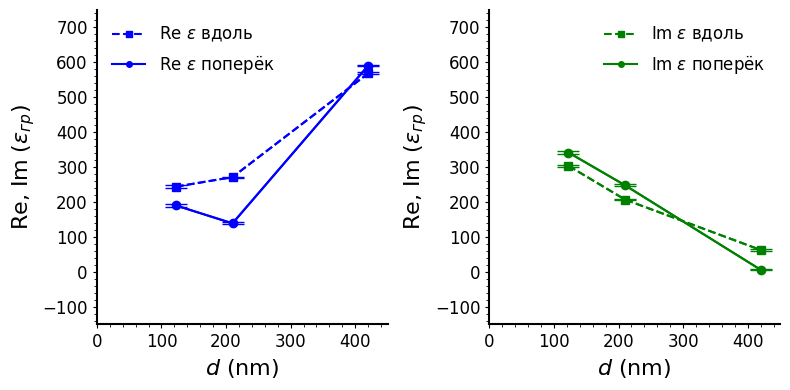

In [31]:

THICKNESS = np.array([3.5, 6, 12, 3.5, 6, 12])*35


# Plot Re, Im vs thickness

HALF_LAYER_EPS = np.array([200, 300, 400, 700])
HALF_LAYER_ERROR = abs(HALF_LAYER_EPS)*1


# Фигура
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# Построение графиков
ax1.plot(THICKNESS[:3], FITTED_EPS_GR[:3, 0], 'bs--', label='Re $\epsilon$ вдоль', markersize=4, linewidth=1.5)
ax1.plot(THICKNESS[3:], FITTED_EPS_GR[3:, 0], 'bo-',  label='Re $\epsilon$ поперёк', markersize=4, linewidth=1.5)
ax2.plot(THICKNESS[:3], FITTED_EPS_GR[:3, 1], 'gs--', label='Im $\epsilon$ вдоль', markersize=4, linewidth=1.5)
ax2.plot(THICKNESS[3:], FITTED_EPS_GR[3:, 1], 'go-',  label='Im $\epsilon$ поперёк', markersize=4, linewidth=1.5)

for ax in (ax1, ax2):
    # Оси
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    
    # Настройка тиков
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1, labelsize=12)
    ax.tick_params(axis='both', which='major', direction='out', length=3, width=0.8)
    ax.minorticks_on()
    # одписи
    ax.set_xlabel(r'$d$ (nm)', fontsize=16)
    ax.set_ylabel(r'Re, Im ($\varepsilon_{гр}$)', fontsize=16)
    # егенда
    ax.legend(fontsize=12, frameon=False)
    # граничения осей
    ax.set_xlim(0, 450)
    ax.set_ylim(-150, 750)

ax1.errorbar(THICKNESS[:3], FITTED_EPS_GR[:3, 0],fmt='bs--', yerr=FITTED_EPS_ERR[:3, 0], capsize=8)
ax1.errorbar(THICKNESS[3:], FITTED_EPS_GR[3:, 0],fmt='bo-',  yerr=FITTED_EPS_ERR[3:, 0], capsize=8)
ax2.errorbar(THICKNESS[:3], FITTED_EPS_GR[:3, 1],fmt='gs--', yerr=FITTED_EPS_ERR[:3, 1], capsize=8)
ax2.errorbar(THICKNESS[3:], FITTED_EPS_GR[3:, 1],fmt='go-',  yerr=FITTED_EPS_ERR[3:, 1], capsize=8)

# Компактная компоновка
plt.tight_layout()


print(
    FITTED_EPS_ERR[:3, 0],
    FITTED_EPS_ERR[3:, 0],
    FITTED_EPS_ERR[:3, 1],
    FITTED_EPS_ERR[3:, 1],
)

plt.savefig(r"C:\Users\belco\Documents\Graphene\Graphene-films-plasmon-refractometry\SPR\Re_Im_SPR")
plt.show()



In [97]:
help(plt.savefig)

Help on function savefig in module matplotlib.pyplot:

savefig(*args, **kwargs)
    Save the current figure.
    
    Call signature::
    
      savefig(fname, *, dpi='figure', format=None, metadata=None,
              bbox_inches=None, pad_inches=0.1,
              facecolor='auto', edgecolor='auto',
              backend=None, **kwargs
             )
    
    The available output formats depend on the backend being used.
    
    Parameters
    ----------
    fname : str or path-like or binary file-like
        A path, or a Python file-like object, or
        possibly some backend-dependent object such as
        `matplotlib.backends.backend_pdf.PdfPages`.
    
        If *format* is set, it determines the output format, and the file
        is saved as *fname*.  Note that *fname* is used verbatim, and there
        is no attempt to make the extension, if any, of *fname* match
        *format*, and no extension is appended.
    
        If *format* is not set, then the format is inf

In [ ]:
%%capture captured_output
print("This is some output that will be captured.")
print('dsdqd')


In [ ]:
# To see the captured output
print(captured_output.stdout)


This is some output that will be captured.
dsdqd



Output for Graphene

[ 7.59362718e-05 -1.73652126e+01  1.54573263e+01] [[2.59352829e-02 7.33066619e+03 4.91923588e+03]
 [7.33066619e+03 2.07202933e+09 1.39043311e+09]
 [4.91923588e+03 1.39043311e+09 9.33048685e+08]] {'nfev': 22, 'fvec': array([ 0.05229159,  0.02730576,  0.00733751, -0.00177501, -0.01267923,
       -0.01116214, -0.01585139, -0.01552167, -0.01615583, -0.01127607,
       -0.00370039, -0.00059034,  0.00589332,  0.00262213,  0.00923649,
        0.01003882,  0.03005525,  0.06952173, -0.00380896, -0.00192459,
        0.00252801, -0.00985361, -0.01425843, -0.00934129, -0.01737556])} `xtol` termination condition is satisfied. 3
[ 4.25775050e-05 -2.12250555e+01  1.64058107e+01] [[1.25365843e-02 3.21931646e+03 2.80787185e+03]
 [3.21931646e+03 8.26700332e+08 7.21043930e+08]
 [2.80787185e+03 7.21043930e+08 6.28890940e+08]] {'nfev': 20, 'fvec': array([-0.02315103, -0.02325791, -0.01380996, -0.01230637, -0.01239795,
       -0.00568362, -0.0022581 ,  0.00378557,  0.01213028,  0.01999438,
        0.01338555,  0.02085058,  0.01390228,  0.01272569,  0.01552649,
        0.00913512,  0.00667343, -0.00063829, -0.01440939, -0.0265432 ,
       -0.02033539, -0.03504897, -0.02999889, -0.03588226, -0.04336887])} `xtol` termination condition is satisfied. 3
[ 3.15980176e-04 -2.62487872e-01  1.65719688e+01] [[1.17829890e+00 3.72083393e+05 2.12363172e+04]
 [3.72083393e+05 1.17496546e+11 6.70600723e+09]
 [2.12363172e+04 6.70600723e+09 3.82739233e+08]] {'nfev': 18, 'fvec': array([ 0.31454186,  0.27340489,  0.22653165,  0.18442761,  0.14421596,
        0.10639081,  0.06840841,  0.03471327,  0.01489626, -0.0138309 ,
       -0.01986846, -0.02807296, -0.02945204, -0.01135762, -0.00299288,
        0.01332764,  0.03607787,  0.07269322,  0.09528935,  0.13101791,
        0.16412761,  0.19972205,  0.22599972,  0.24660709,  0.25171041])} `ftol` termination condition is satisfied. 2
[ 3.70863925e-04 -1.20572135e+01  1.92281597e+01] [[3.08330941e-03 8.86461706e+02 4.10513890e+02]
 [8.86461706e+02 2.54860687e+08 1.18024108e+08]
 [4.10513890e+02 1.18024108e+08 5.46560958e+07]] {'nfev': 30, 'fvec': array([ 0.01471383,  0.0010112 , -0.00509819, -0.01155057, -0.00819774,
       -0.00933923, -0.01124167, -0.00892202, -0.00238645,  0.00064884,
        0.00045429,  0.0069914 ,  0.01175907,  0.01281741,  0.00734155,
        0.00981536,  0.00242355,  0.00207002,  0.00518737,  0.02174302,
       -0.00078658, -0.00595041, -0.03410087, -0.03848992, -0.03972996])} `xtol` termination condition is satisfied. 3
[ 9.08769658e-05 -1.47915856e+01  2.19336732e+01] [[1.20480373e-01 3.46017356e+04 1.90214378e+04]
 [3.46017356e+04 9.93755314e+09 5.46292099e+09]
 [1.90214378e+04 5.46292099e+09 3.00310410e+09]] {'nfev': 21, 'fvec': array([ 0.64732577,  0.47295517,  0.28579123,  0.08637141, -0.04917005,
       -0.09226727, -0.10121303, -0.11716258, -0.09984836, -0.0511567 ,
       -0.00622396,  0.05251959,  0.11031623,  0.13671901,  0.19320394,
        0.19368189,  0.20904292,  0.24150535,  0.25370996,  0.26606207])} `ftol` termination condition is satisfied. 2
[ 1.50921556e-04 -1.52573030e+01  1.87554441e+01] [[2.89455689e-01 7.05106294e+04 3.96008492e+04]
 [7.05106294e+04 1.71762002e+10 9.64666062e+09]
 [3.96008492e+04 9.64666062e+09 5.41784924e+09]] {'nfev': 34, 'fvec': array([ 7.58989065e-01,  6.97226636e-01,  5.89553271e-01,  4.51534070e-01,
        1.82788258e-01,  9.73188548e-02,  3.52530325e-02, -2.89399171e-02,
       -6.61407364e-02, -7.83506515e-02, -6.72741820e-02, -4.50028390e-02,
       -2.96680973e-04,  4.69913700e-02,  1.01528572e-01,  1.73025512e-01,
        2.72218574e-01,  3.25522114e-01,  3.41651710e-01,  3.83088290e-01,
        3.76483266e-01,  3.70302671e-01,  4.15567889e-01])} `xtol` termination condition is satisfied. 3


In [ ]:

        # Plot Re, Im vs thickness
        re_fit_vec[i] = params[1]
        im_fit_vec[i] = params[2]

NameError: name 're_fit_vec' is not defined

In [ ]:
thickness_ax = np.concatenate((np.array([0.5, 1])*35e-9, thickness[[0, 2, 4]]))*1e9
print(thickness_ax)
re_al_ax = np.concatenate([[256, -15], re_fit_vec[[0, 2, 4]]])
im_al_ax = np.concatenate([[268, 700], im_fit_vec[[0, 2, 4]]])
re_tr_ax = np.concatenate([[367, -15], re_fit_vec[[1, 3, 5]]])
im_tr_ax = np.concatenate([[465, 700], im_fit_vec[[1, 3, 5]]])
print(re_al_ax)

NameError: name 'thickness' is not defined

In [ ]:
print(thickness_ax)
print(re_tr_ax)
print(re_al_ax)
print(im_tr_ax)
print(im_al_ax)
perm_to_csv = pd.DataFrame(np.array((thickness_ax, re_tr_ax, im_tr_ax, re_al_ax, im_al_ax)))
perm_to_csv.to_csv(sep = ';', decimal=',', lineterminator=' ')

[ 17.5  35.  122.5 210.  420. ]
[ 367.          -15.         -106.06497879  -89.70401155  -25.52513442]
[ 256.          -15.         -115.12837619  -42.80687833  -69.6968218 ]
[465.         700.         175.56703178  85.14965219 122.05264105]
[268.         700.          84.04457708  65.37145437  85.40609104]


';0;1;2;3;4 0;17,5;35,0;122,50000000000001;210,0;420,0 1;367,0;-15,0;-106,06497879326211;-89,70401155298795;-25,525134416450737 2;465,0;700,0;175,56703178256726;85,14965218899137;122,0526410470918 3;256,0;-15,0;-115,12837618603318;-42,80687832819221;-69,69682180163046 4;268,0;700,0;84,04457707860017;65,37145436936585;85,40609103580088 '

Попробуем разобраться с погрешностями $\epsilon$

Создадим тестовые данные с гауссовым шумом  

In [30]:
thickness = np.array([3.5, 3.5, 6, 6, 12, 12])*35e-9
def create_data(x, shift, eps3_re, eps3_im):
        return reflect4(x - np.ones(x.size, dtype=np.float64) * shift, d_3 = thickness[i], 
          teta = 7.28050201e-01, eps3_re=eps3_re, eps3_im=eps3_im, eps4_re=-7, eps4_im=17)
_d = np.linspace(0, 1000*1e-6, 1000) 
data_noise = create_data(_d, 1e-4, -100, 170)+np.random.normal(0, 0, 1000)

__params, __pcov , infodict , mesg, ier = curve_fit(create_data, 
                                                        _d, data_noise, 
          p0=[1e-4, -95, 173], bounds = ([0.5*1e-4, -110, 160], [1.5e-4, -90, 180]),
 method='trf', full_output=True)
plt.plot(_d, data_noise)
plt.plot(_d, create_data(_d, *__params))
_diff = create_data(_d, 1.2e-4, -100, 171) -  create_data(_d, 1e-4, -100, 171)

#print(_diff)


NameError: name 'i' is not defined

Мы видим, что даже без шума регрессия работает плохо
Следующий шаг - аналитически посчитать якобианы матриц S2

In [ ]:
help(curve_fit)

Help on function curve_fit in module scipy.optimize._minpack_py:

curve_fit(f, xdata, ydata, p0=None, sigma=None, absolute_sigma=False, check_finite=True, bounds=(-inf, inf), method=None, jac=None, *, full_output=False, **kwargs)
    Use non-linear least squares to fit a function, f, to data.
    
    Assumes ``ydata = f(xdata, *params) + eps``.
    
    Parameters
    ----------
    f : callable
        The model function, f(x, ...). It must take the independent
        variable as the first argument and the parameters to fit as
        separate remaining arguments.
    xdata : array_like or object
        The independent variable where the data is measured.
        Should usually be an M-length sequence or an (k,M)-shaped array for
        functions with k predictors, but can actually be any object.
    ydata : array_like
        The dependent data, a length M array - nominally ``f(xdata, ...)``.
    p0 : array_like, optional
        Initial guess for the parameters (length N). If No

In [ ]:

from Functions.reflect import reflect_n




(-0.745474103616478+0.018757066886641673j)
kz[1.13375744-1.47775826e-03j 0.005881  +2.33732400e-01j
 0.80947505+4.32548796e+00j]
 r[ 0.60961065-0.76667712j -0.87656871+8.5396671j ]
 t[2.46070429-1.17600079j 1.95936725+0.35826733j]
 Pr[[[2.10706963-0.03952708j 0.        +0.j        ]
  [0.        +0.j         0.47442581+0.00889988j]]]
 Rfr[[[0.33082682+0.1581062j  0.32289196-0.15725413j]
  [0.32289196-0.15725413j 0.33082682+0.1581062j ]]

 [[0.49385743-0.09030108j 0.33824122+4.29653314j]
  [0.33824122+4.29653314j 0.49385743-0.09030108j]]]

S2[[1.03702265-0.20979141j 0.88252721+9.0397248j ]
 [0.12223173+2.04139652j 0.23510238-0.03844589j]]
S[[ 0.73672992+0.73448417j -1.06740598+3.08073178j]
 [ 0.0195358 +0.46385826j  1.79035173+2.80452563j]]
0.19916704551829584
[0.00000000e+00 1.00100100e-06 2.00200200e-06 3.00300300e-06
 4.00400400e-06 5.00500501e-06 6.00600601e-06 7.00700701e-06
 8.00800801e-06 9.00900901e-06 1.00100100e-05 1.10110110e-05
 1.20120120e-05 1.30130130e-05 1.40140140e-05 1

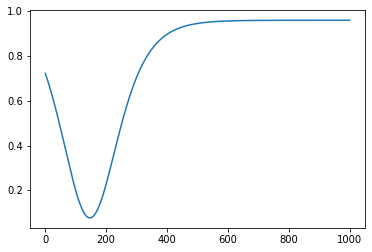

In [ ]:
eps_re = np.array([2.34, 1, -17])
eps_im = np.array([-0.0061, 0, 7])

teta = 0.736

_gap = np.linspace(0, 1000*1e-6, 1000)

print(reflect_n(3, teta, np.array([100*1e-6]), eps_re, eps_im))
print(_gap)

_R = []
def part_reflect_n(d):
    return reflect_n(3, 0.736, d, eps_re, eps_im)

for _gaps in _gap:
    
    _R = _R+[part_reflect_n(np.array([_gaps]))]
    print([_gaps, _R])
print(_R)

plt.plot(_gap*10**6, np.array(_R))

plt.show()


In [ ]:
a = np.array([[1, 2], [np.nan, 3]])
print(np.isnan(a))
np.any(np.isnan(a))

[[False False]
 [ True False]]


True

In [ ]:
_R = np.array([])
def part_reflect_n(d):
    return reflect_n()

for gaps in gap:
    _R.append(reflect_n(gaps)) 


def g(a): return len(a) 

def f(b):
    def h(j):
        return np.vectorize(g)
    return h(b)

a = np.array([i for i in range(4)])
b = np.array([[i for i in range(4)]])
print(b)
print(g(a))
print(f(b))




In [ ]:
number = 4
e = [sy.Symbol(f'e{i}') for i in range(number)]
teta, wl = sy.symbols('\u03F4 \u03BB')
S = sy.Matrix([[wl, wl],  [wl, wl]])
R = S[0, 0]
R**2



λ**2

In [ ]:

eps = [sy.Symbol(f'\u03B5{i}') for i in range(number)]
kz = [sy.Symbol(f'kz{i}') for i in range(number)]
r = [sy.Symbol(f'r{i}{i+1}') for i in range(number-1)]
t = [sy.Symbol(f't{i}{i+1}') for i in range(number-1)]
thickness = [sy.Symbol(f'd{i+1}') for i in range(number-2)]
teta, wavelength, j1 = sy.symbols('\u03F4 \u03BB i')
print(eps, kz, r, t, thickness, teta, wavelength, j1)

[ε0, ε1, ε2, ε3] [kz0, kz1, kz2, kz3] [r01, r12, r23] [t01, t12, t23] [d1, d2] ϴ λ i


Grozin: notes on sympy https://www.inp.nsk.su/~grozin/python/python1.html

In [ ]:
def r_coef(number):

    eps = [sy.Symbol(f'\u03B5{i}') for i in range(number)]
    kz = [sy.Symbol(f'kz{i}') for i in range(number)]
    r = [sy.Symbol(f'r{i}{i+1}') for i in range(number-1)]

    #wave vectors
    kz[0] = sy.sqrt(eps[0]) * sy.cos(teta)
    for i in range(number-1):
        kz[i+1] = sy.sqrt(eps[i+1] - eps[0] * sy.sin(teta)**2)

    
    # Fresnel coefficients 
    r = [(eps[i+1] * kz[i] - eps[i] * kz[i+1]) / (eps[i+1] * kz[i] + eps[i] * kz[i+1]) for i in range(number-1)]
    return r


def sym_reflect_n(number):
    
    eps = [sy.Symbol(f'\u03B5{i}') for i in range(number)]
    kz = [sy.Symbol(f'kz{i}') for i in range(number)]
    r = [sy.Symbol(f'r{i}{i+1}') for i in range(number-1)]
    t = [sy.Symbol(f't{i}{i+1}') for i in range(number-1)]
    thickness = [sy.Symbol(f'd{i+1}') for i in range(number-2)]
    teta, wavelength = sy.symbols('\u03F4 \u03BB')

     


    if (number == 2):
        
        #kz[0] = eps[0] * sy.cos(teta)
        #kz[1] = sy.sqrt(eps[1]-eps[0] * sy.sin(teta))
        r = (eps[1] * kz[0] - eps[0] * kz[1]) / (eps[1] * kz[0] + eps[0] * kz[1])
        return (sy.Abs(r))**2
    


    if (number > 2):  

        """
        #wave vectors
        kz[0] = sy.sqrt(eps[0]) * sy.cos(teta)

        for i in range(number-1):
            kz[i+1] = sy.sqrt(eps[i+1] - eps[0] * sy.sin(teta)**2)

        
        # Fresnel coefficients 
        r = [(eps[i+1] * kz[i] - eps[i] * kz[i+1]) / (eps[i+1] * kz[i] + eps[i] * kz[i+1]) for i in range(number-1)]
        
        
        t = [1-r[i] for i in range(number-1)]

        """
        
        # Propagation matrix
  

        phase = [(sy.I * (2 * sy.pi ) * kz[i+1] / wavelength) *  thickness[i] for i in range(number-2)]
        Pr = [sy.diag(sy.exp(-phase[i]), sy.exp(phase[i])) for i in range(number-2)]


        # Refraction matrix
        Rfr = [sy.Matrix([[1, r[i]], [r[i], 1]]) for i in range(number-1)]

        S = Rfr[0]

        for i in range(number-2):
            S = sy.together(S*Pr[i]*Rfr[i+1])
        #    print(f'S2{Pr[i]@Rfr[i+1]}')
        #    print(f'S{S}')


        # reflection coefficient
        S10 = S[1, 0]
        S00 = S[0, 0]
        R_ex = sy.expand(R)
        return sy.simplify(sy.expand(S10/S00))


In [ ]:


display(r_coef(2))


[(0.742871964784234*sqrt(ε0)*ε1 - ε0*sqrt(-0.448141243937612*ε0 + ε1))/(0.742871964784234*sqrt(ε0)*ε1 + ε0*sqrt(-0.448141243937612*ε0 + ε1))]

### Chain rule

In [ ]:
a = sym_reflect_n(3)
display(a)

AttributeError: 'ImmutableDenseNDimArray' object has no attribute 'expand'

In [ ]:
sy.simplify(sy.diff(a, r[0]))

(-r12**2*exp(8*I*pi*d1*kz1/λ) + 1)/(r01**2*r12**2*exp(8*I*pi*d1*kz1/λ) + 2*r01*r12*exp(4*I*pi*d1*kz1/λ) + 1)

In [ ]:
sy.simplify(sy.diff(a, r[1]))

(1 - r01**2)*exp(4*I*pi*d1*kz1/λ)/(r01**2*r12**2*exp(8*I*pi*d1*kz1/λ) + 2*r01*r12*exp(4*I*pi*d1*kz1/λ) + 1)

In [ ]:
r0 = r_coef(3)
sy.simplify(sy.diff(r0[0], eps[1]))

ε0**(3/2)*(-2*ε0*sin(ϴ)**2 + ε1)*cos(ϴ)/(sqrt(-ε0*sin(ϴ)**2 + ε1)*(sqrt(ε0)*ε1*cos(ϴ) + ε0*sqrt(-ε0*sin(ϴ)**2 + ε1))**2)

In [ ]:
sy.simplify(sy.diff(r0[1], eps[1]))

ε2*sqrt(-ε0*sin(ϴ)**2 + ε2)*(2*ε0*sin(ϴ)**2 - ε1)/(sqrt(-ε0*sin(ϴ)**2 + ε1)*(ε1*sqrt(-ε0*sin(ϴ)**2 + ε2) + ε2*sqrt(-ε0*sin(ϴ)**2 + ε1))**2)

In [ ]:
# define derivatives

a = sym_reflect_n(3)
D_s3_kz1 = sy.simplify(sy.diff(a, kz[1]))
D_s3_kz2 = sy.simplify(sy.diff(a, kz[2]))
D_kz1_eps1 = sy.simplify(sy.diff(a, kz[2]))





### Recurrent formula proof

In [ ]:
sy.simplify(sy.diff(a, kz[1]))

4*I*pi*d1*r12*(1 - r01**2)*exp(4*I*pi*d1*kz1/λ)/(λ*(r01**2*r12**2*exp(8*I*pi*d1*kz1/λ) + 2*r01*r12*exp(4*I*pi*d1*kz1/λ) + 1))

thickness[0]

## $ s_{i+1} = \frac {s_{i} + r_{i+1, i+2} *exp(\frac {4i\pi d_{i+1} k_{i+1}} {\lambda})} {1 + s_i * r_{i+1, i+2} * exp(\frac {4i \pi d_{i+1} k_{i+1}}{\lambda})} $
where  $r_{ij}$ - Fresnel's coefficients and $R_i = |s_i|^2 $ - reflection coefficient


In [ ]:
(a + r[2]*sy.exp(4*sy.I*thickness[1]/wavelength)) / (a*r[2]*sy.exp(4*sy.I*thickness[1]/wavelength) + 1)

NameError: name 'r' is not defined

In [ ]:
a = sym_reflect_n(3)
sy.simplify((a + r[2]*sy.exp(4*sy.I*thickness[1]/wavelength)) / (a*r[2]*sy.exp(4*sy.I*thickness[1]/wavelength) + 1))

(r01 + r12*exp(4*I*pi*d1*kz1/λ) + r23*(r01*r12*exp(4*I*pi*d1*kz1/λ) + 1)*exp(4*I*d2/λ))/(r01*r12*exp(4*I*pi*d1*kz1/λ) + r23*(r01 + r12*exp(4*I*pi*d1*kz1/λ))*exp(4*I*d2/λ) + 1)

In [ ]:
sy.together(sy.diff(a, eps[1]))

((-sqrt(ε0)*ε1**2*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) + sqrt(ε0)*ε1**2*sqrt(-ε0*sin(ϴ)**2 + ε2)*cos(ϴ) + sqrt(ε0)*ε1*ε2*sqrt(-ε0*sin(ϴ)**2 + ε1)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) + sqrt(ε0)*ε1*ε2*sqrt(-ε0*sin(ϴ)**2 + ε1)*cos(ϴ) - ε0**2*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*sin(ϴ)**2 + ε0**2*ε2*sin(ϴ)**2 + ε0*ε1*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ) - ε0*ε1*ε2 - ε0*ε1*sqrt(-ε0*sin(ϴ)**2 + ε1)*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ) - ε0*ε1*sqrt(-ε0*sin(ϴ)**2 + ε1)*sqrt(-ε0*sin(ϴ)**2 + ε2))*(4*I*pi*d1*sqrt(ε0)*ε1**2*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) - 4*I*pi*d1*sqrt(ε0)*ε1*ε2*sqrt(-ε0*sin(ϴ)**2 + ε1)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) - 4*I*pi*d1*ε0**2*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*sin(ϴ)**2 + 4*I*pi*d1*ε0*ε1*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ) - 4*I*pi*d1*ε0*ε1*sqrt(-ε0*sin(ϴ)**2 + ε1)*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I

In [ ]:
kz[0] = sy.sqrt(eps[0]) * sy.cos(teta)
kz[0]
print(kz[0], sy.diff(kz[0], eps[0]))

sqrt(ε0)*cos(ϴ) cos(ϴ)/(2*sqrt(ε0))


# $\displaystyle \frac{r_{01} + r_{12} e^{\frac{4 \pi d_{1} i kz_{1}}{λ}}}{r_{01} r_{12} e^{\frac{4 \pi d_{1} i kz_{1}}{λ}} + 1}$

In [ ]:
если k вещественный, то матрицы коммутируют

$\displaystyle \frac{r_{01} r_{12} r_{23} e^{\frac{4 \pi d_{2} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}}{λ}} + r_{01} + r_{12} e^{\frac{4 \pi d_{1} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}}}{λ}} + r_{23} e^{\frac{4 \pi i \left(d_{1} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}} + d_{2} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}\right)}{λ}}}{r_{01} r_{12} e^{\frac{4 \pi d_{1} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}}}{λ}} + r_{01} r_{23} e^{\frac{4 \pi i \left(d_{1} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}} + d_{2} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}\right)}{λ}} + r_{12} r_{23} e^{\frac{4 \pi d_{2} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}}{λ}} + 1}$

Построим цветной двумерный график комплексной функции $R(eps_{graph})$ для пленки на полипропилене при 45 и 0 градусах. 


def sym_reflect_2_unpol():
    
    eps = [sy.Symbol(f'\u03B5{i}') for i in range(number)]
    kz = [sy.Symbol(f'kz{i}') for i in range(number)]
    r = [sy.Symbol(f'r{i}{i+1}') for i in range(number-1)]
    t = [sy.Symbol(f't{i}{i+1}') for i in range(number-1)]
    thickness = [sy.Symbol(f'd{i+1}') for i in range(number-2)]
    teta, wavelength = sy.symbols('\u03F4 \u03BB')

     


    if (number == 2):
        
        #kz[0] = eps[0] * sy.cos(teta)
        #kz[1] = sy.sqrt(eps[1]-eps[0] * sy.sin(teta))
        r = (eps[1] * kz[0] - eps[0] * kz[1]) / (eps[1] * kz[0] + eps[0] * kz[1])
        return (sy.Abs(r))**2
    

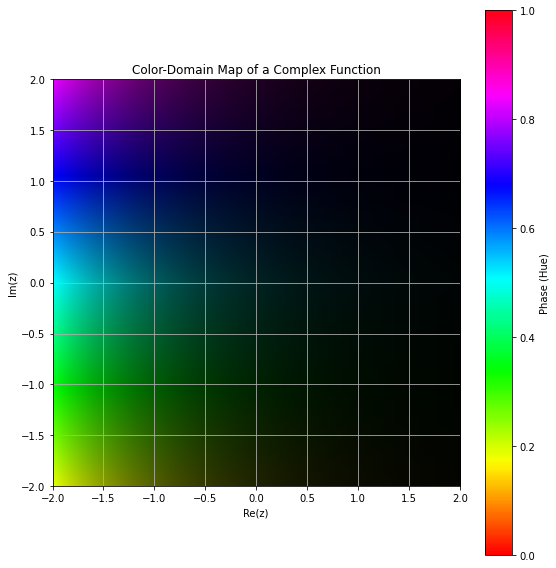

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

# Define a complex-valued function f(x, y)
def complex_function(x, y):
    z = x + 1j * y  # Create a complex number z = x + iy
    return np.exp(-z)  # Example function

# Create a grid of x and y values
x = np.linspace(-2, 2, 500)  # X range
y = np.linspace(-2, 2, 500)  # Y range
X, Y = np.meshgrid(x, y)  # Create grid

# Compute the complex function on the grid
Z = complex_function(X, Y)

# Extract magnitude and phase
magnitude = np.abs(Z)  # Magnitude
phase = np.angle(Z)    # Phase (angle in radians)

# Normalize magnitude for brightness (value in HSV)
magnitude_normalized = magnitude / np.max(magnitude)

# Map phase (-π to π) to hue (0 to 1)
hue = (phase + np.pi) / (2 * np.pi)

# Create HSV image
hsv_image = np.zeros((*Z.shape, 3))  # HSV has 3 channels
hsv_image[..., 0] = hue              # Hue
hsv_image[..., 1] = 1.0              # Saturation (fully saturated)
hsv_image[..., 2] = magnitude_normalized  # Value (normalized magnitude)

# Convert HSV to RGB for plotting
rgb_image = hsv_to_rgb(hsv_image)

# Plot the color-domain map
plt.figure(figsize=(8, 8))
plt.imshow(rgb_image, extent=[x.min(), x.max(), y.min(), y.max()])
plt.title("Color-Domain Map of a Complex Function")
plt.xlabel("Re(z)")
plt.ylabel("Im(z)")
plt.colorbar(plt.cm.ScalarMappable(cmap="hsv"), label="Phase (Hue)")
plt.grid()
plt.tight_layout()
plt.show()

